In [1]:
import numpy as np
import math
import pickle
import operator
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import urllib2
import time
from scipy.misc import imread
from scipy.misc import imresize
from scipy.optimize import linear_sum_assignment
from gensim import corpora, models

In [2]:
lda_1 = models.ldamodel.LdaModel.load('data/20-topics.model')
lda_2 = models.ldamodel.LdaModel.load('data2/20-topics.model')
num_topics = 20

In [3]:
cost = np.zeros((num_topics,num_topics))
for topic_1 in range(num_topics):
    feats_1 = lda_1.show_topic(topic_1, topn=4096) # get topic-feature distribution for topic in model 1
    feats_1 = sorted(feats_1, key = lambda x:int(x[0]))
    feats_1 = np.array([feats_1[i][1] for i in range(4096)])
    for topic_2 in range(num_topics):
        feats_2 = lda_2.show_topic(topic_2, topn=4096) # get topic-feature distribution for topic in model 2
        feats_2 = sorted(feats_2, key = lambda x:int(x[0]))
        feats_2 = np.array([feats_2[i][1] for i in range(4096)])
        cost[topic_1, topic_2] = np.sum(np.abs(feats_1-feats_2))


In [4]:
row_ind, col_ind = linear_sum_assignment(cost)

In [5]:
# load the list of images
img_list = np.load('data/image_list_yfcc100m_output_100k_crop.npy')

# Load results from 1st model
with open("data/20-topic-res.txt", "rb") as fp:
    img_by_topic_1 = pickle.load(fp)

# Load results from 2nd model
with open("data2/20-topic-res-all.txt", "rb") as fp:
    img_by_topic_2 = pickle.load(fp)

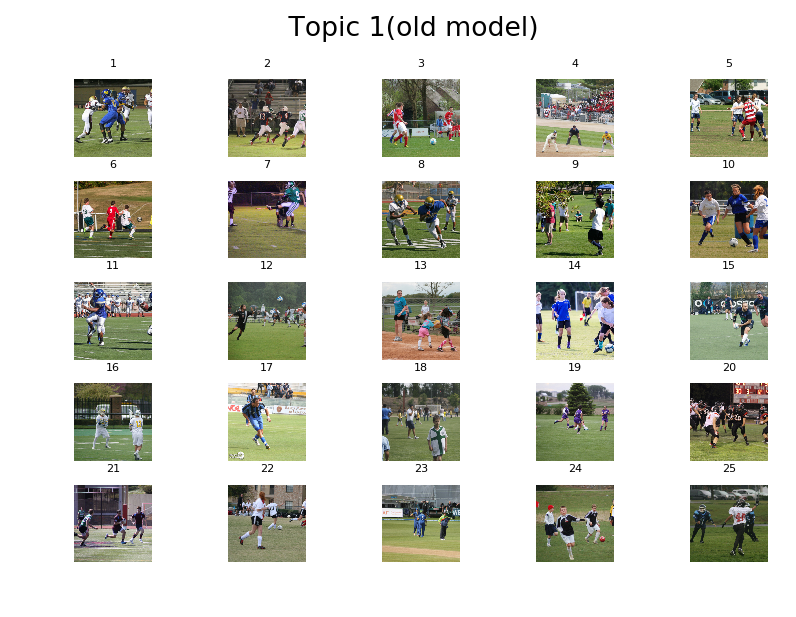

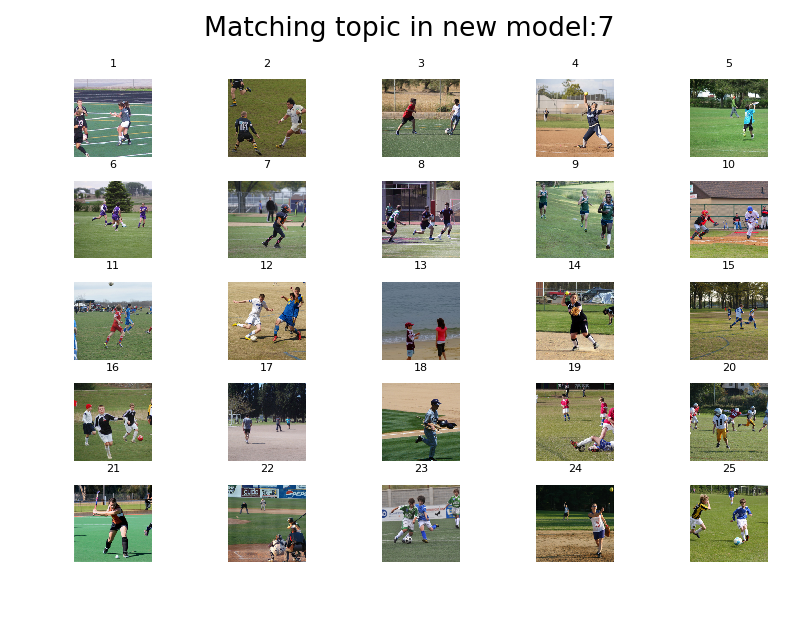

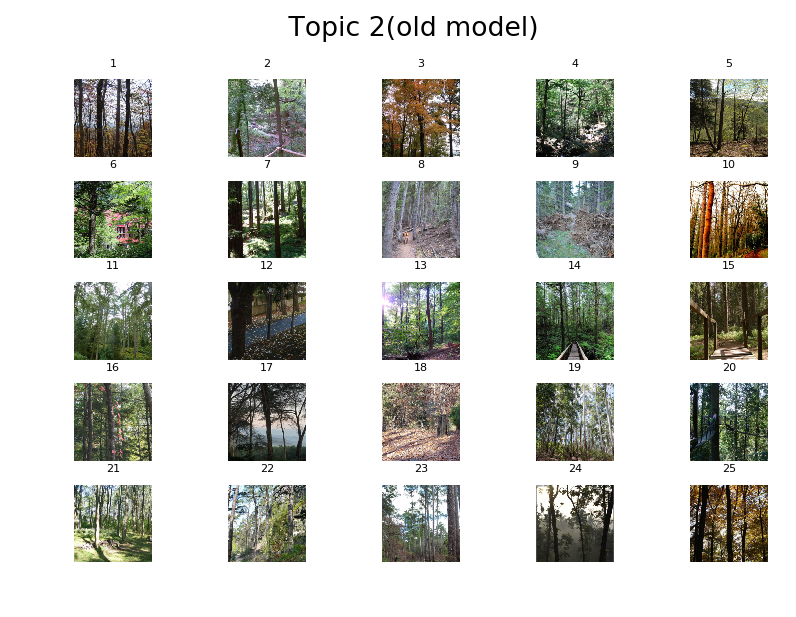

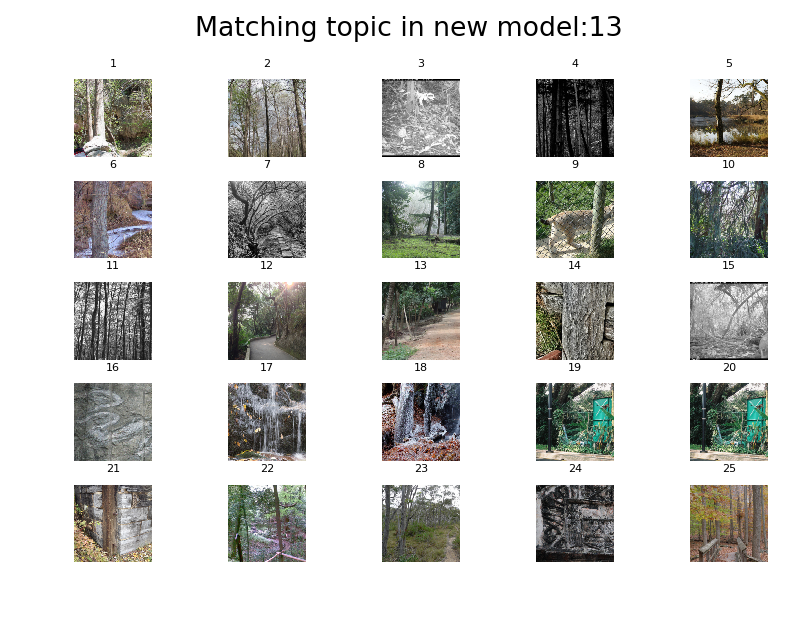

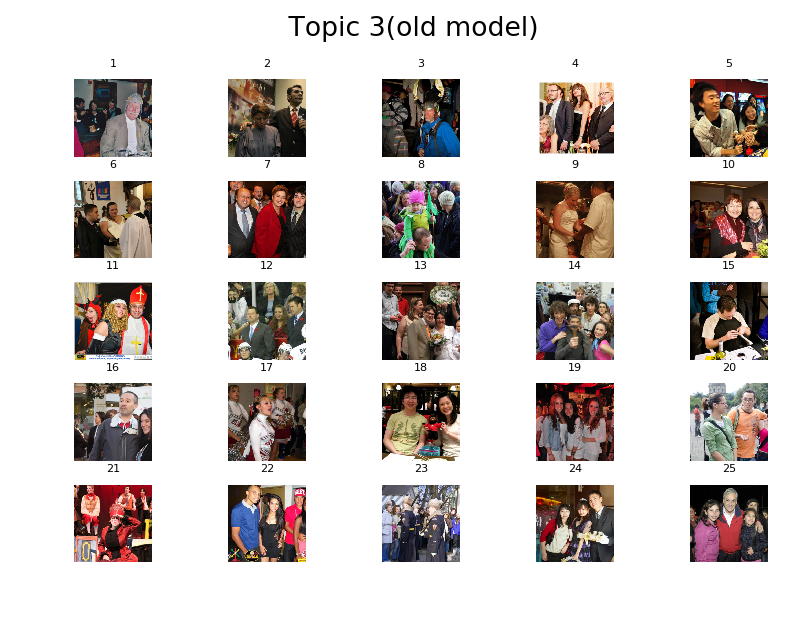

...

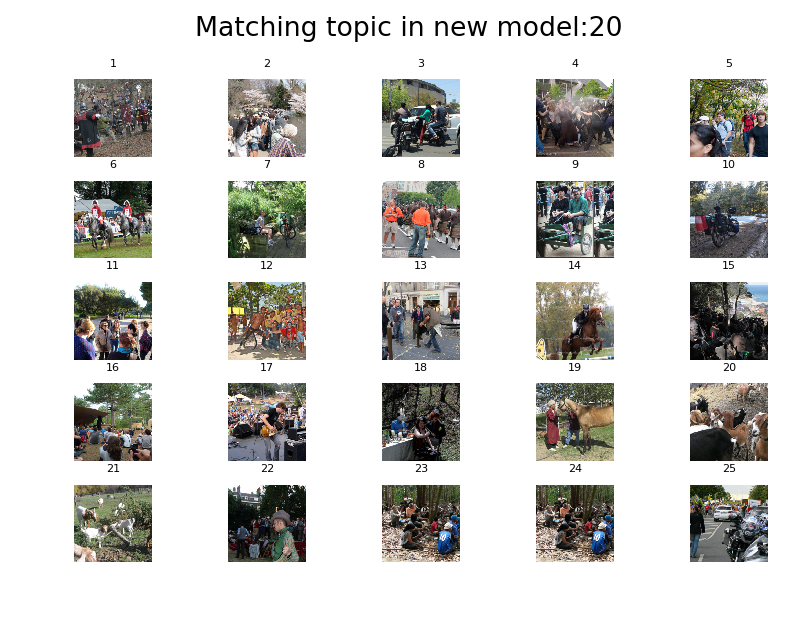

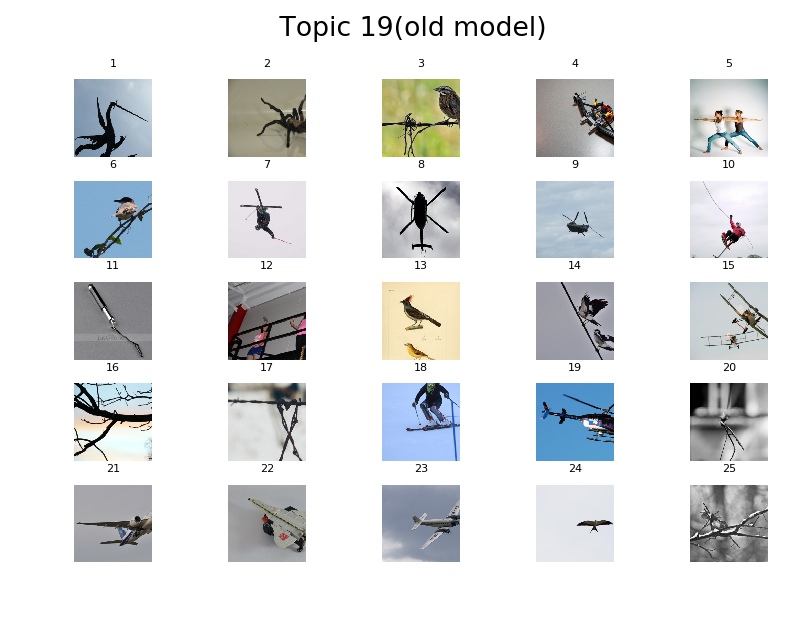

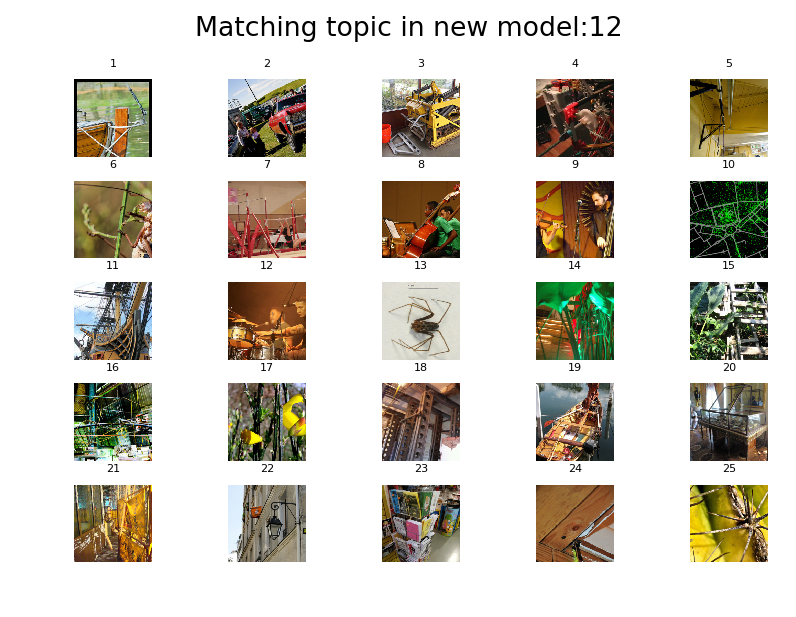

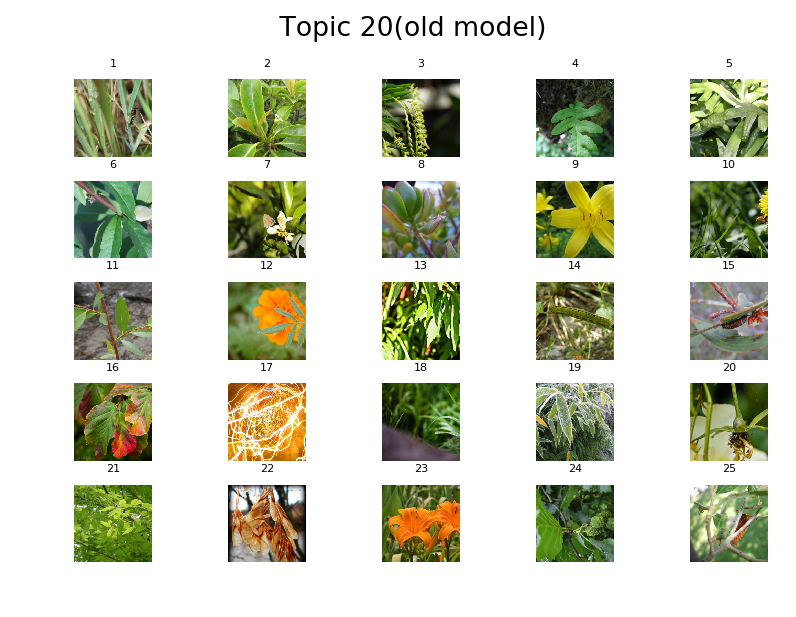

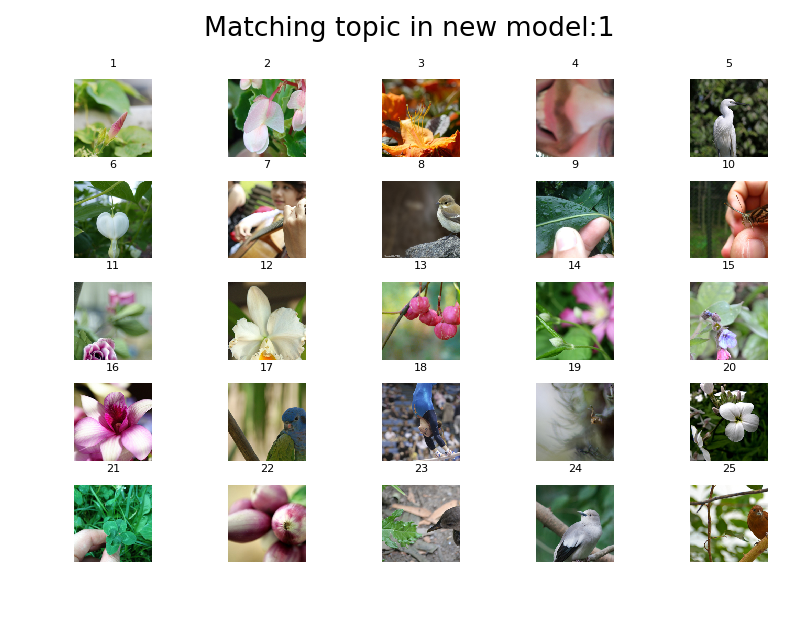

In [6]:
topic_list = range(num_topics)
for topic in topic_list:
    fig, ax = plt.subplots(nrows=5, ncols=5, dpi=160)
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.3)
    fig.suptitle(' Topic '+str(topic+1)+'(old model)')
    i = 0
    for row in ax:
        for col in row:
            image_url = 'https://multimedia-commons.s3-us-west-2.amazonaws.com/data/images'+img_list[img_by_topic_1[topic][i][0]].split('data')[2]
            # create a file-like object from the url
            f = urllib2.urlopen(image_url)
            # read the image from url
            I = plt.imread(f,  format='jpg')
            min_dim = min(I.shape[0],I.shape[1])
            r = 227.0/min_dim
            new_width = I.shape[0]*r
            new_height = I.shape[1]*r
            I = imresize(I,(int(math.ceil(new_width)),int(math.ceil(new_height)),3))
            I = I[0:227,0:227,:3]
            i += 1
            col.axis('off')
            col.set_title(i, fontsize=5)
            col.imshow(I)
    plt.show()
    
    fig, ax = plt.subplots(nrows=5, ncols=5, dpi=160)
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.3)
    fig.suptitle('Matching topic in new model:'+str(col_ind[topic]+1))
    i = 0
    for row in ax:
        for col in row:
            image_url = 'https://multimedia-commons.s3-us-west-2.amazonaws.com/data/images'+img_list[img_by_topic_2[col_ind[topic]][i][0]].split('data')[2]
            # create a file-like object from the url
            f = urllib2.urlopen(image_url)
            # read the image from url
            I = plt.imread(f,  format='jpg')
            min_dim = min(I.shape[0],I.shape[1])
            r = 227.0/min_dim
            new_width = I.shape[0]*r
            new_height = I.shape[1]*r
            I = imresize(I,(int(math.ceil(new_width)),int(math.ceil(new_height)),3))
            I = I[0:227,0:227,:3]
            i += 1
            col.axis('off')
            col.set_title(i, fontsize=5)
            col.imshow(I)
    plt.show() 
